# Train 2D U-Net and make predictions
**Author: Chentao Wen**

## Load program and data

### Load packages

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
from seg2link_unet2d.unet2 import TrainingUNet2D, UNet2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


C:\Users\chint\anaconda3\envs\pytorch\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Create the trainer

In [3]:
trainer = TrainingUNet2D(data_path=os.path.abspath("./unet_01"), model=UNet2)

Made folders under: C:\Wen\Project\seg2link_unet2d\Examples
Following folders were made: 
unet_01\train_image
unet_01\train_label
unet_01\test_image
unet_01\test_label
unet_01\models_2022_Jun_22-12_50_37


### Move the training data and test data to the folders like below:

    │   Train and predict with 2D U-Net (clear).ipynb
    └───unet_01
        ├───models_2022_Apr_22-10_07_25
        ├───test_image
        │       EM raw data stack0000.tif
        │       EM raw data stack0001.tif
        │       EM raw data stack0002.tif
        │       ...
        ├───train_image
        │       train_image0000.tif
        │       train_image0001.tif
        │       train_image0002.tif
        │       ...
        └───train_label
                train_cells0000.tif
                train_cells0001.tif
                train_cells0002.tif
                ...


### Load training data

Load 30 images. Shape (image #1): (1024, 512)
Load 30 images. Shape (image #1): (1024, 512)


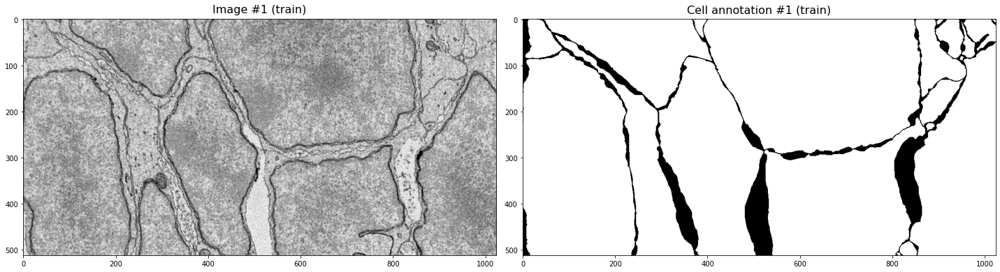

In [4]:
trainer.load_dataset()
trainer.draw_dataset()

### Normalize training data

Images were normalized


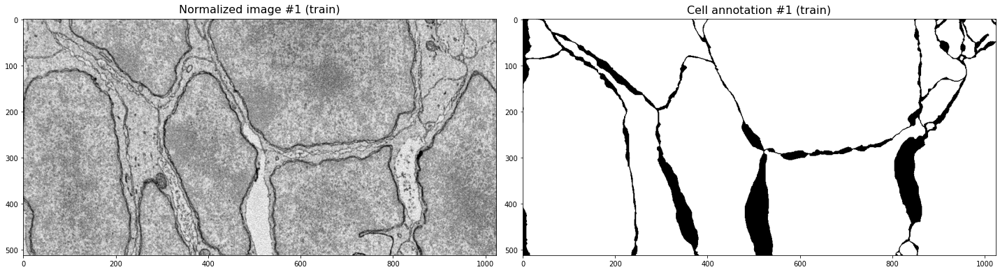

In [5]:
trainer.normalize()
trainer.draw_norm_dataset()

## Train 2D U-Net

### Prepare training data by division and augmentation

Divide into 2160 images
Flipped into 4320 images
Rotated into 17280 images
Divide into 2160 images
Flipped into 4320 images
Rotated into 17280 images
Images were divided into 17280 sub-images with shape: torch.Size([1, 160, 160])


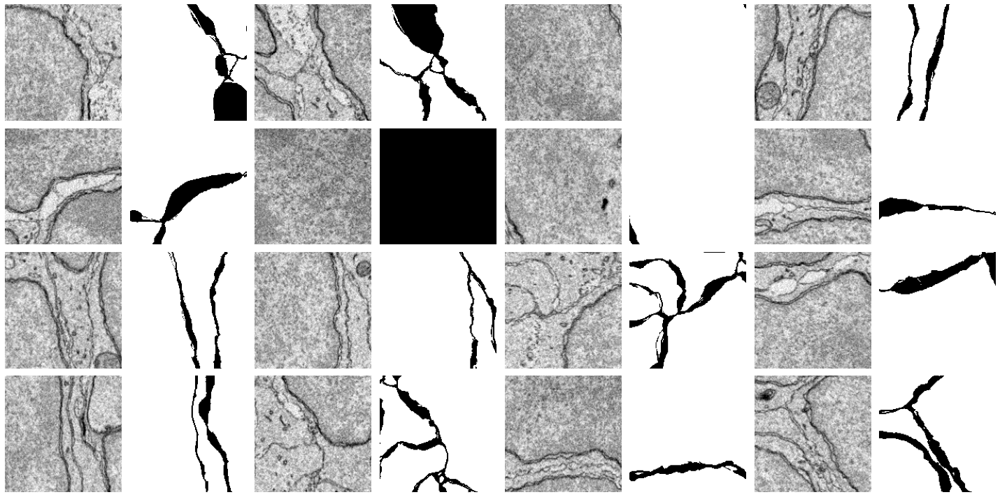

In [6]:
trainer.divide_images()
trainer.draw_divided_train_data()

### Train

C:\Users\chint\anaconda3\envs\pytorch\lib\site-packages\torch\nn\functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


(Before training) Train loss: 0.7873749077320099, Train accuracy: 0.28064194321632385


Epoch 1/10: 33batch [00:19,  1.69batch/s, Train loss=0.613]


Train loss: 0.5506587862968445, Train accuracy: 0.7907339334487915


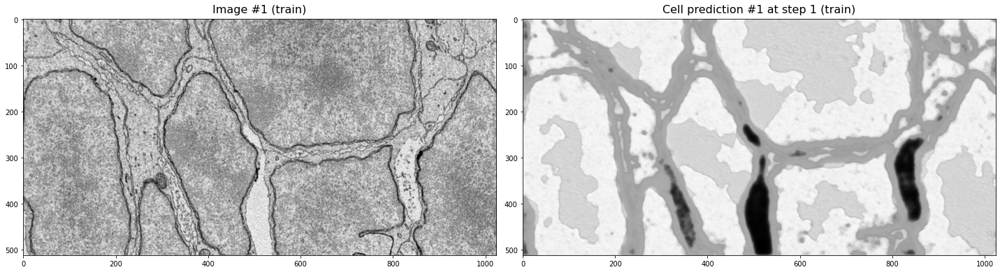

Epoch 2/10: 33batch [00:20,  1.62batch/s, Train loss=0.516]


Train loss: 0.48540317416191103, Train accuracy was improved from 0.7907339334487915 to 0.9027073383331299


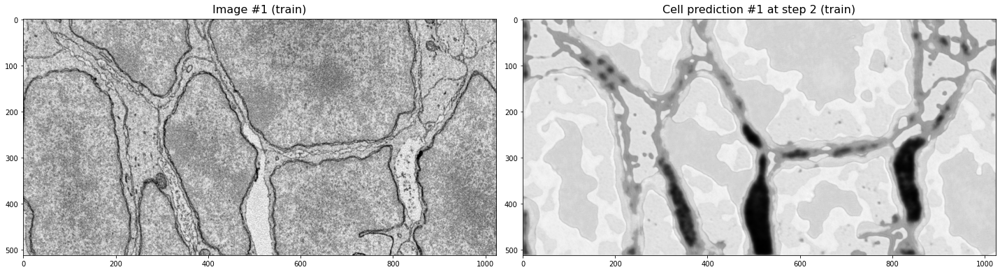

Epoch 3/10: 33batch [00:18,  1.76batch/s, Train loss=0.456]


Train loss: 0.42517086764176687, Train accuracy was improved from 0.9027073383331299 to 0.9456885457038879


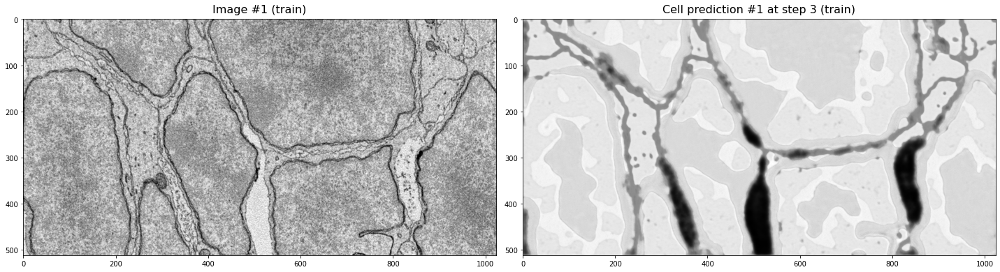

Epoch 4/10: 33batch [00:18,  1.80batch/s, Train loss=0.402]


Train loss: 0.37477535704771675, Train accuracy was improved from 0.9456885457038879 to 0.9574348330497742


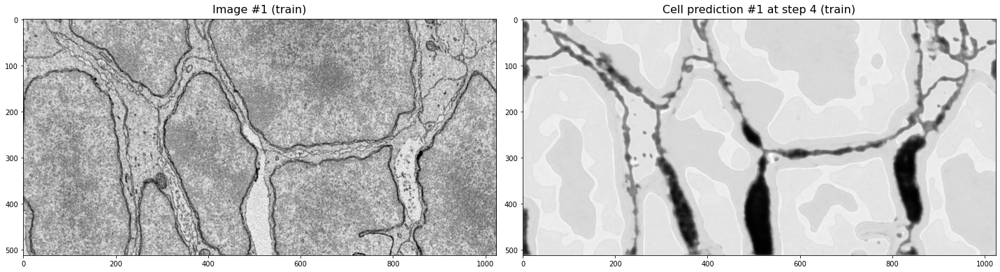

Epoch 5/10: 33batch [00:18,  1.81batch/s, Train loss=0.355]
Epoch 6/10: 33batch [00:18,  1.80batch/s, Train loss=0.316]


Train loss: 0.2900074064731598, Train accuracy was improved from 0.9574348330497742 to 0.960281491279602


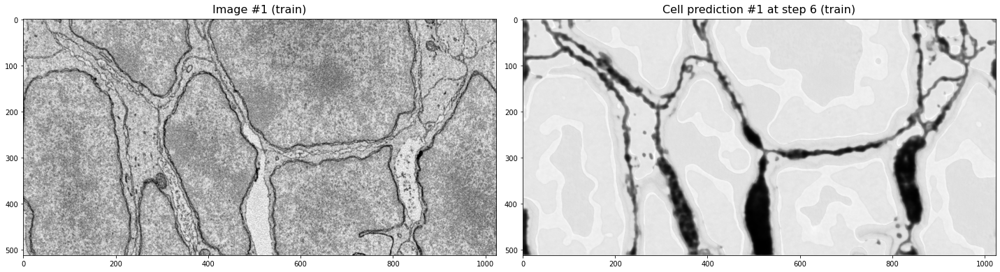

Epoch 7/10: 33batch [00:21,  1.57batch/s, Train loss=0.269]


Train loss: 0.2517901529868444, Train accuracy was improved from 0.960281491279602 to 0.9610995650291443


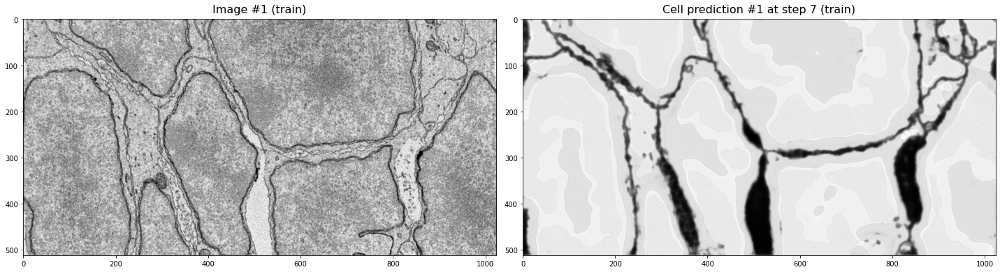

Epoch 8/10: 33batch [00:18,  1.76batch/s, Train loss=0.237]


Train loss: 0.21889595091342925, Train accuracy was improved from 0.9610995650291443 to 0.9663084149360657


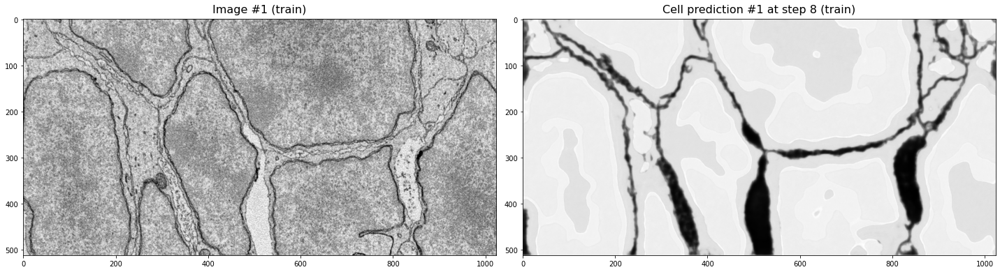

Epoch 9/10: 33batch [00:18,  1.79batch/s, Train loss=0.201]


Train loss: 0.1933571696281433, Train accuracy was improved from 0.9663084149360657 to 0.9675997495651245


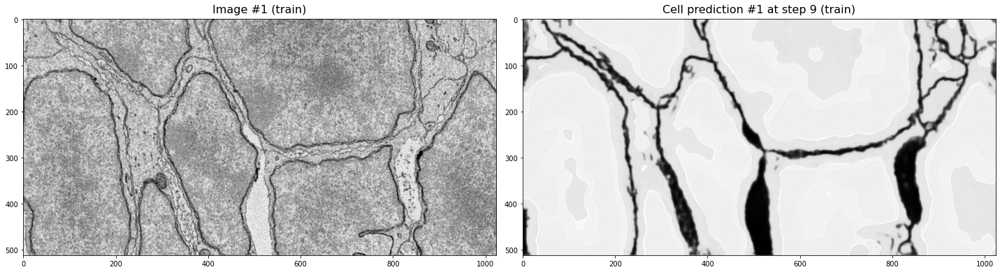

Epoch 10/10: 33batch [00:18,  1.76batch/s, Train loss=0.18]


Train loss: 0.1716127946972847, Train accuracy was improved from 0.9675997495651245 to 0.9705297946929932


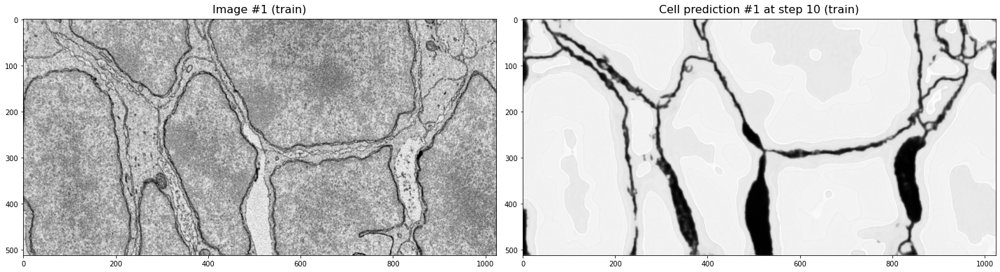

The best model has been saved as: 
C:\Wen\Project\seg2link_unet2d\Examples\unet_01\models_2022_Jun_22-12_50_37\pretrained_unet3.pt


In [7]:
trainer.train(iteration=10)

In [ ]:
trainer.train(iteration=10)

In [ ]:
trainer.train(iteration=10)

## Predict cell/non-cell in test images

### Load pretrained 2D U-Net
**Replace the path in the brackets with the file you have trained**

In [11]:
trainer.load_pretrained_unet(
    r"./unet_01/models_2022_Jun_22-12_50_37/pretrained_unet3.pt"
)

### Predict and show result of the first slice

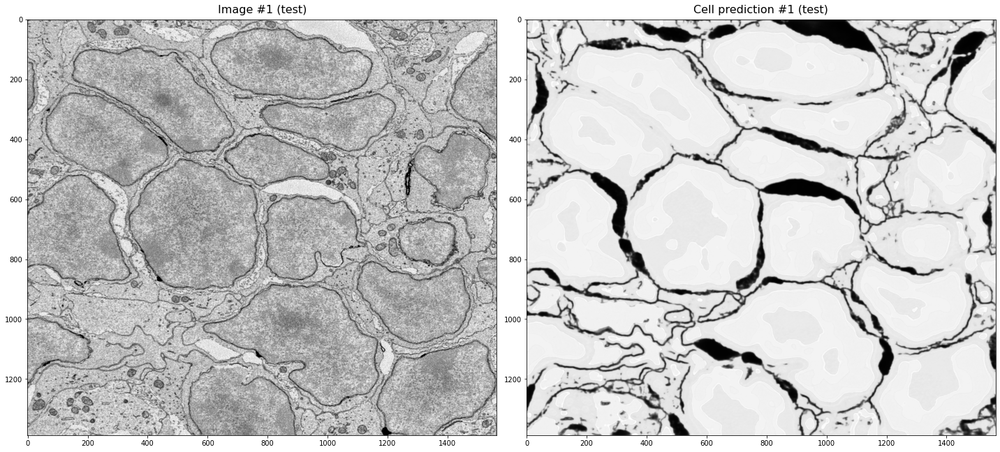

In [12]:
trainer.predict_test_image1()

### Predict and save results for all slices

In [13]:
trainer.save_predictions_test()

100%|██████████| 50/50 [00:46<00:00,  1.07slice/s]
